# Telecom Churn Case Study

### Importing neccessary packages and set few parameters

In [366]:
import pandas as pd
import numpy as np 
import matplotlib.pyplot as plt
import seaborn as sns
pd.options.display.float_format = '{:,.2f}'.format
pd.set_option('display.min_rows', 999)
pd.set_option('display.max_columns',999)
pd.set_option('display.max_rows',999)
import warnings
warnings.filterwarnings('ignore')

In [367]:
#Importing the  telecom dataset csv file
rawdata = pd.read_csv('telecom_churn_data.csv')

### Understanding the dataset

In [368]:
# Reading the first few records to understand the dataset
#rawdata.head()

In [369]:
# Checking the shape of dataset
rawdata.shape
# Rows :- 99999 , Cols :- 226

(99999, 226)

In [370]:
# Checking data types of columns
rawdata.info(verbose=True,null_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99999 entries, 0 to 99998
Data columns (total 226 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   mobile_number             99999 non-null  int64  
 1   circle_id                 99999 non-null  int64  
 2   loc_og_t2o_mou            98981 non-null  float64
 3   std_og_t2o_mou            98981 non-null  float64
 4   loc_ic_t2o_mou            98981 non-null  float64
 5   last_date_of_month_6      99999 non-null  object 
 6   last_date_of_month_7      99398 non-null  object 
 7   last_date_of_month_8      98899 non-null  object 
 8   last_date_of_month_9      98340 non-null  object 
 9   arpu_6                    99999 non-null  float64
 10  arpu_7                    99999 non-null  float64
 11  arpu_8                    99999 non-null  float64
 12  arpu_9                    99999 non-null  float64
 13  onnet_mou_6               96062 non-null  float64
 14  onnet

In [371]:
# Checking the stats 
rawdata.describe()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_t2c_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_t2o_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
count,"99,999.00","99,999.00","98,981.00","98,981.00","98,981.00","99,999.00","99,999.00","99,999.00","99,999.00","96,062.00","96,140.00","94,621.00","92,254.00","96,062.00","96,140.00","94,621.00","92,254.00","96,062.00","96,140.00","94,621.00","92,254.00","96,062.00","96,140.00","94,621.00","92,254.00","96,062.00","96,140.00","94,621.00","92,254.00","96,062.00","96,140.00","94,621.00","92,254.00","96,062.00","96,140.00","94,621.00","92,254.00","96,062.00","96,140.00","94,621.00","92,254.00","96,062.00","96,140.00","94,621.00","92,254.00","96,062.00","96,140.00","94,621.00","92,254.00","96,062.00","96,140.00","94,621.00","92,254.00","96,062.00","96,140.00","94,621.00","92,254.00","96,062.00","96,140.00","94,621.00","92,254.00","96,062.00","96,140.00","94,621.00","92,254.00","96,062.00","96,140.00","94,621.00","92,254.00","96,062.00","96,140.00","94,621.00","92,254.00","96,062.00",

#### Calculating Total data recharge amount 

In [372]:
# Finding High Value Customers

# calculating the total data recharge amount for June & July as
# total number of data recharges done in a month * average recharge amount 
rawdata['total_data_rech_6'] = rawdata.total_rech_data_6 * rawdata.av_rech_amt_data_6
rawdata['total_data_rech_7'] = rawdata.total_rech_data_7 * rawdata.av_rech_amt_data_7

rawdata.shape

(99999, 228)

#### Adding total data recharge amount and total recharge amount to get combined total recharge amount

In [373]:
rawdata['tot_amt_6']=rawdata[['total_data_rech_6','total_rech_amt_6']].sum(axis=1)
rawdata['tot_amt_7']=rawdata[['total_data_rech_7','total_rech_amt_7']].sum(axis=1)

rawdata.shape

(99999, 230)

In [374]:
# calculating 70th percentile value to filter High Value Customers

rawdata['avg_tot_amt_6_7'] = (rawdata['tot_amt_6']+ rawdata['tot_amt_7'])/2

rawdata.shape

(99999, 231)

In [375]:
#  70% value : 478
print(rawdata['avg_tot_amt_6_7'].quantile(.7))

# Filtering out high value customers
df_hvc=rawdata[(rawdata['avg_tot_amt_6_7']>=rawdata['avg_tot_amt_6_7'].quantile(.7))]


478.0


In [376]:
df_hvc.shape

(30001, 231)

In [377]:
# Identifying churned customers 
# based on the fact that the value of 'vol_3g_mb_9', 'vol_2g_mb_9','total_ic_mou_9','total_og_mou_9' should be 0

df_hvc['churn']=df_hvc[['vol_3g_mb_9', 'vol_2g_mb_9','total_ic_mou_9','total_og_mou_9']].apply(lambda x: 1 if ((x['vol_3g_mb_9']==0) & (x['vol_2g_mb_9']==0.0) & (x['total_ic_mou_9']==0)  & (x['total_og_mou_9']==0)) else 0, axis=1)


In [378]:
df_hvc['churn'].value_counts()

0    27560
1     2441
Name: churn, dtype: int64

### As you can see above 2441 customers have churned 

### Handling missing values

In [379]:
# Finding percentage of missing values in the columns
missing_data=pd.DataFrame({'Missing Values':df_hvc.isnull().sum(),'Missing_value_%':(df_hvc.isnull().sum()*100/len(df_hvc))}).sort_values(by='Missing_value_%',ascending=False)


In [380]:
#pd.set_option("display.max_rows",250)
missing_data

,Missing Values,Missing_value_%
arpu_3g_9,14781,49.27
fb_user_9,14781,49.27
count_rech_2g_9,14781,49.27
max_rech_data_9,14781,49.27
arpu_2g_9,14781,49.27
count_rech_3g_9,14781,49.27
total_rech_data_9,14781,49.27
date_of_last_rech_data_9,14781,49.27
night_pck_user_9,14781,49.27
av_rech_amt_data_9,14781,49.27


## More missing value in DATA recharge columns as compared to call based recharge

In [381]:
# Analysing the rows which have large no of missing column values

df_hvc[df_hvc.isnull().sum(axis=1)>= 40]

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_t2c_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_t2o_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,date_of_last_rech_data_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,total_data_rech_6,total_data_rech_7,tot_amt_6,tot_amt_7,avg_tot_amt_6_7,churn
0,7000842753,109,0.00,0.00,0.00,6/30/2014,7/31/2014,8/31/2014,9/30/2014,197.38,214.82,213.80,21.10,nan,nan,0.00,nan,nan,nan,0.00,nan,nan,nan,0.00,nan,nan,nan,0.00,nan,nan,nan,0.00,nan,nan,nan,0.00,nan,nan,nan,0.00,nan,nan,nan,0.00,nan,nan,nan,0.00,nan,nan,nan,0.00,nan,nan,nan,0.00,nan,nan,nan,0.00,nan,nan,nan,0.00,nan,nan,nan,0.00,nan,nan,nan,0.00,nan,nan,nan,0.00,nan,nan,nan,0.00,nan,0.00,0.00,0.00,0.00,nan,nan,0.16,nan,nan,nan,4.13,nan,nan,nan,1.15,nan,nan,nan,5.44,nan,nan,nan,0.00,nan,nan,nan,0.00,nan,nan,nan,0.00,nan,nan,nan,0.00,nan,nan,nan,

In [382]:
# Finding out columns which are null when 'date_of_last_rech_data_6' is NULL
df_hvc[df_hvc.isnull().sum(axis=1)>= 40].columns[df_hvc[pd.isnull(df_hvc['date_of_last_rech_data_6'])].isna().all()]



Index(['date_of_last_rech_data_6', 'total_rech_data_6', 'max_rech_data_6',
       'count_rech_2g_6', 'count_rech_3g_6', 'av_rech_amt_data_6', 'arpu_3g_6',
       'arpu_2g_6', 'night_pck_user_6', 'fb_user_6', 'total_data_rech_6'],
      dtype='object')

In [383]:
# Finding out columns which are null when 'date_of_last_rech_data_7' is NULL
df_hvc[df_hvc.isnull().sum(axis=1)>= 40].columns[df_hvc[pd.isnull(df_hvc['date_of_last_rech_data_7'])].isna().all()]


Index(['date_of_last_rech_data_7', 'total_rech_data_7', 'max_rech_data_7',
       'count_rech_2g_7', 'count_rech_3g_7', 'av_rech_amt_data_7', 'arpu_3g_7',
       'arpu_2g_7', 'night_pck_user_7', 'fb_user_7', 'total_data_rech_7'],
      dtype='object')

In [384]:
# Finding out columns which are null when 'date_of_last_rech_data_8' is NULL
df_hvc[df_hvc.isnull().sum(axis=1)>= 40].columns[df_hvc[pd.isnull(df_hvc['date_of_last_rech_data_8'])].isna().all()]


Index(['date_of_last_rech_data_8', 'total_rech_data_8', 'max_rech_data_8',
       'count_rech_2g_8', 'count_rech_3g_8', 'av_rech_amt_data_8', 'arpu_3g_8',
       'arpu_2g_8', 'night_pck_user_8', 'fb_user_8'],
      dtype='object')

#### Since ALL the data & call related recharge columns of a particular month is having null values So this can be considered as  case of non usage of service rather than a missing values so the null columns can be imputed by 0



In [310]:
[c for c in df_hvc.columns if 'total_data_rech' in c]
# why 'total_data_rech_8' col not present ????

['total_data_rech_6', 'total_data_rech_7']

In [385]:
#'date_of_last_rech_data_6','date_of_last_rech_data_7','date_of_last_rech_data_8'
df_hvc[['total_rech_data_6', 'max_rech_data_6', 'count_rech_2g_6'
       , 'count_rech_3g_6', 'av_rech_amt_data_6', 'arpu_3g_6', 'arpu_2g_6'
       ,  'total_data_rech_6', 'total_rech_data_7', 'max_rech_data_7', 'count_rech_2g_7'
       , 'count_rech_3g_7', 'av_rech_amt_data_7', 'arpu_3g_7', 'arpu_2g_7' 
       ,  'total_data_rech_7', 'total_rech_data_8', 'max_rech_data_8', 'count_rech_2g_8'
       , 'count_rech_3g_8', 'av_rech_amt_data_8', 'arpu_3g_8', 'arpu_2g_8']]=df_hvc[['total_rech_data_6', 'max_rech_data_6', 'count_rech_2g_6'
       , 'count_rech_3g_6', 'av_rech_amt_data_6', 'arpu_3g_6', 'arpu_2g_6', 'total_data_rech_6', 'total_rech_data_7', 'max_rech_data_7', 'count_rech_2g_7'
       , 'count_rech_3g_7', 'av_rech_amt_data_7', 'arpu_3g_7', 'arpu_2g_7'
       ,  'total_data_rech_7', 'total_rech_data_8', 'max_rech_data_8', 'count_rech_2g_8'
       , 'count_rech_3g_8', 'av_rech_amt_data_8', 'arpu_3g_8', 'arpu_2g_8']].fillna(0,axis=1)



In [386]:

# After tagging churners, remove all the attributes corresponding to the churn phase (all attributes having ‘ _9’, etc. in their names).

#df_hvc[['vol_3g_mb_9', 'vol_2g_mb_9','total_ic_mou_9','total_og_mou_9']]

df_hvc.drop(columns=[c for c in df_hvc.columns if '_9' in c ],inplace=True)

In [387]:
# checking missing values in data
miss_data_after_fillna=pd.DataFrame({'Missing Values':df_hvc.isnull().sum(),'Missing_value_%':(df_hvc.isnull().sum()*100/len(df_hvc))}).sort_values(by='Missing_value_%',ascending=False)


In [388]:
miss_data_after_fillna[miss_data_after_fillna['Missing_value_%'] > 0]

,Missing Values,Missing_value_%
night_pck_user_8,14048,46.83
date_of_last_rech_data_8,14048,46.83
fb_user_8,14048,46.83
night_pck_user_6,13245,44.15
date_of_last_rech_data_6,13245,44.15
fb_user_6,13245,44.15
night_pck_user_7,12944,43.15
date_of_last_rech_data_7,12944,43.15
fb_user_7,12944,43.15
std_ic_t2f_mou_8,1174,3.91


In [389]:
print(df_hvc['last_date_of_month_6'].unique())
print(df_hvc['last_date_of_month_7'].unique())
print(df_hvc['last_date_of_month_8'].unique())

['6/30/2014']
['7/31/2014' nan]
['8/31/2014' nan]


In [390]:
# Replacing null values above with last month dates
df_hvc['last_date_of_month_6']=df_hvc['last_date_of_month_6'].fillna('6/30/2014')
df_hvc['last_date_of_month_7']=df_hvc['last_date_of_month_7'].fillna('7/31/2014')
df_hvc['last_date_of_month_8']=df_hvc['last_date_of_month_8'].fillna('8/31/2014')

In [391]:
print(df_hvc['last_date_of_month_6'].unique())
print(df_hvc['last_date_of_month_7'].unique())
print(df_hvc['last_date_of_month_8'].unique())

['6/30/2014']
['7/31/2014']
['8/31/2014']


In [392]:
pd.DataFrame({'Missing Values':df_hvc.isnull().sum(),'Missing_value_%':(df_hvc.isnull().sum()*100/len(df_hvc))}).sort_values(by='Missing_value_%',ascending=False)


,Missing Values,Missing_value_%
night_pck_user_8,14048,46.83
date_of_last_rech_data_8,14048,46.83
fb_user_8,14048,46.83
fb_user_6,13245,44.15
night_pck_user_6,13245,44.15
date_of_last_rech_data_6,13245,44.15
night_pck_user_7,12944,43.15
date_of_last_rech_data_7,12944,43.15
fb_user_7,12944,43.15
std_ic_t2f_mou_8,1174,3.91


In [126]:
df_hvc.columns[df_hvc.isna().any()]

Index(['loc_og_t2o_mou', 'std_og_t2o_mou', 'loc_ic_t2o_mou', 'onnet_mou_6',
       'onnet_mou_7', 'onnet_mou_8', 'offnet_mou_6', 'offnet_mou_7',
       'offnet_mou_8', 'roam_ic_mou_6', 'roam_ic_mou_7', 'roam_ic_mou_8',
       'roam_og_mou_6', 'roam_og_mou_7', 'roam_og_mou_8', 'loc_og_t2t_mou_6',
       'loc_og_t2t_mou_7', 'loc_og_t2t_mou_8', 'loc_og_t2m_mou_6',
       'loc_og_t2m_mou_7', 'loc_og_t2m_mou_8', 'loc_og_t2f_mou_6',
       'loc_og_t2f_mou_7', 'loc_og_t2f_mou_8', 'loc_og_t2c_mou_6',
       'loc_og_t2c_mou_7', 'loc_og_t2c_mou_8', 'loc_og_mou_6', 'loc_og_mou_7',
       'loc_og_mou_8', 'std_og_t2t_mou_6', 'std_og_t2t_mou_7',
       'std_og_t2t_mou_8', 'std_og_t2m_mou_6', 'std_og_t2m_mou_7',
       'std_og_t2m_mou_8', 'std_og_t2f_mou_6', 'std_og_t2f_mou_7',
       'std_og_t2f_mou_8', 'std_og_t2c_mou_6', 'std_og_t2c_mou_7',
       'std_og_t2c_mou_8', 'std_og_mou_6', 'std_og_mou_7', 'std_og_mou_8',
       'isd_og_mou_6', 'isd_og_mou_7', 'isd_og_mou_8', 'spl_og_mou_6',
       'spl_o

In [393]:
# Handling date_of_last_rech_data cols 
datecols=['date_of_last_rech_6',
'date_of_last_rech_7',
'date_of_last_rech_8',
'date_of_last_rech_9',
'date_of_last_rech_data_6',
'date_of_last_rech_data_7',
'date_of_last_rech_data_8',
'date_of_last_rech_data_9',
'last_date_of_month_9']

In [399]:
[i for i in df_hvc.columns if 'date' in i ]

['last_date_of_month_6',
 'last_date_of_month_7',
 'last_date_of_month_8',
 'date_of_last_rech_6',
 'date_of_last_rech_7',
 'date_of_last_rech_8',
 'date_of_last_rech_data_6',
 'date_of_last_rech_data_7',
 'date_of_last_rech_data_8']

In [400]:
#Checking nulls in date columns
df_hvc[[i for i in df_hvc.columns if 'date' in i ]].info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 30001 entries, 0 to 99997
Data columns (total 9 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   last_date_of_month_6      30001 non-null  object
 1   last_date_of_month_7      30001 non-null  object
 2   last_date_of_month_8      30001 non-null  object
 3   date_of_last_rech_6       29928 non-null  object
 4   date_of_last_rech_7       29903 non-null  object
 5   date_of_last_rech_8       29418 non-null  object
 6   date_of_last_rech_data_6  16756 non-null  object
 7   date_of_last_rech_data_7  17057 non-null  object
 8   date_of_last_rech_data_8  15953 non-null  object
dtypes: object(9)
memory usage: 2.3+ MB


In [410]:
df_hvc["last_date_of_month_6"]=pd.to_datetime(df_hvc["last_date_of_month_6"])
df_hvc["last_date_of_month_7"]=pd.to_datetime(df_hvc["last_date_of_month_7"])
df_hvc["last_date_of_month_8"]=pd.to_datetime(df_hvc["last_date_of_month_8"])
df_hvc["date_of_last_rech_6"]=pd.to_datetime(df_hvc["date_of_last_rech_6"])
df_hvc["date_of_last_rech_7"]=pd.to_datetime(df_hvc["date_of_last_rech_7"])
df_hvc["date_of_last_rech_8"]=pd.to_datetime(df_hvc["date_of_last_rech_8"])
df_hvc["date_of_last_rech_data_6"]=pd.to_datetime(df_hvc["date_of_last_rech_data_6"])
df_hvc["date_of_last_rech_data_7"]=pd.to_datetime(df_hvc["date_of_last_rech_data_7"])
df_hvc["date_of_last_rech_data_8"]=pd.to_datetime(df_hvc["date_of_last_rech_data_8"])

In [411]:
df_hvc[[i for i in df_hvc.columns if 'date' in i ]].dtypes

last_date_of_month_6        datetime64[ns]
last_date_of_month_7        datetime64[ns]
last_date_of_month_8        datetime64[ns]
date_of_last_rech_6         datetime64[ns]
date_of_last_rech_7         datetime64[ns]
date_of_last_rech_8         datetime64[ns]
date_of_last_rech_data_6    datetime64[ns]
date_of_last_rech_data_7    datetime64[ns]
date_of_last_rech_data_8    datetime64[ns]
dtype: object

In [413]:
df_hvc[[i for i in df_hvc.columns if 'date' in i ]].info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 30001 entries, 0 to 99997
Data columns (total 9 columns):
 #   Column                    Non-Null Count  Dtype         
---  ------                    --------------  -----         
 0   last_date_of_month_6      30001 non-null  datetime64[ns]
 1   last_date_of_month_7      30001 non-null  datetime64[ns]
 2   last_date_of_month_8      30001 non-null  datetime64[ns]
 3   date_of_last_rech_6       29928 non-null  datetime64[ns]
 4   date_of_last_rech_7       29903 non-null  datetime64[ns]
 5   date_of_last_rech_8       29418 non-null  datetime64[ns]
 6   date_of_last_rech_data_6  16756 non-null  datetime64[ns]
 7   date_of_last_rech_data_7  17057 non-null  datetime64[ns]
 8   date_of_last_rech_data_8  15953 non-null  datetime64[ns]
dtypes: datetime64[ns](9)
memory usage: 2.3 MB


In [414]:

#3 new columns for days since recharge.
df_hvc["days_since_recharge_6"] = df_hvc["last_date_of_month_6"] - df_hvc["date_of_last_rech_6"]
df_hvc["days_since_recharge_7"] = df_hvc["last_date_of_month_7"] - df_hvc["date_of_last_rech_7"]
df_hvc["days_since_recharge_8"] = df_hvc["last_date_of_month_8"] - df_hvc["date_of_last_rech_8"]


In [456]:

df_hvc["days_since_recharge_6"] = df_hvc["days_since_recharge_6"].dt.days
df_hvc["days_since_recharge_7"] = df_hvc["days_since_recharge_7"].dt.days
df_hvc["days_since_recharge_8"] = df_hvc["days_since_recharge_8"].dt.days

In [457]:
# Imputing days since recharge fields with 0 value :
for col in ['days_since_recharge_6','days_since_recharge_7','days_since_recharge_8']:
        df_hvc[col].fillna(0,inplace=True)

In [424]:
date_columns_to_be_dropped = ["last_date_of_month_6","last_date_of_month_7","last_date_of_month_8", 
                              "date_of_last_rech_6", "date_of_last_rech_7", "date_of_last_rech_8",
                              "date_of_last_rech_data_6","date_of_last_rech_data_7","date_of_last_rech_data_8"]
df_hvc = df_hvc.drop(columns=date_columns_to_be_dropped)

In [420]:
df_hvc.shape

(30001, 173)

In [423]:
# Dropping ID columns "mobile_number","circle_id"

df_hvc=df_hvc.drop(columns=["mobile_number","circle_id"])

In [422]:
df_hvc.shape

(30001, 173)

In [426]:
# Re-checking the missing value percentage
pd.DataFrame({'Missing Values':df_hvc.isnull().sum(),'Missing_value_%':(df_hvc.isnull().sum()*100/len(df_hvc))}).sort_values(by='Missing_value_%',ascending=False)


,Missing Values,Missing_value_%
fb_user_8,14048,46.83
night_pck_user_8,14048,46.83
date_of_last_rech_data_8,14048,46.83
fb_user_6,13245,44.15
night_pck_user_6,13245,44.15
date_of_last_rech_data_6,13245,44.15
fb_user_7,12944,43.15
night_pck_user_7,12944,43.15
date_of_last_rech_data_7,12944,43.15
std_ic_mou_8,1174,3.91


In [316]:
# #Converting the  above features to category
# df_hvc[['rech_amt_6','rech_amt_7','rech_amt_8','rech_data_6','rech_data_7','rech_data_8' ]] = df_hvc[['rech_amt_6','rech_amt_7','rech_amt_8','rech_data_6','rech_data_7','rech_data_8']].apply(lambda x: x.astype('category'))
# # Viewing the value of newly created category fields
# df_hvc[['rech_amt_6','rech_amt_7','rech_amt_8','rech_data_6','rech_data_7','rech_data_8' ]].nunique()
# Dropping date columns now 
# df_hvc.drop(columns=date_Columns_To_Transform,inplace=True)

In [427]:
# Fetching all the columns with null values

df_hvc_null_cols=df_hvc.columns[df_hvc.isna().any()].tolist()

In [428]:
df_hvc_null_cols

['loc_og_t2o_mou',
 'std_og_t2o_mou',
 'loc_ic_t2o_mou',
 'onnet_mou_6',
 'onnet_mou_7',
 'onnet_mou_8',
 'offnet_mou_6',
 'offnet_mou_7',
 'offnet_mou_8',
 'roam_ic_mou_6',
 'roam_ic_mou_7',
 'roam_ic_mou_8',
 'roam_og_mou_6',
 'roam_og_mou_7',
 'roam_og_mou_8',
 'loc_og_t2t_mou_6',
 'loc_og_t2t_mou_7',
 'loc_og_t2t_mou_8',
 'loc_og_t2m_mou_6',
 'loc_og_t2m_mou_7',
 'loc_og_t2m_mou_8',
 'loc_og_t2f_mou_6',
 'loc_og_t2f_mou_7',
 'loc_og_t2f_mou_8',
 'loc_og_t2c_mou_6',
 'loc_og_t2c_mou_7',
 'loc_og_t2c_mou_8',
 'loc_og_mou_6',
 'loc_og_mou_7',
 'loc_og_mou_8',
 'std_og_t2t_mou_6',
 'std_og_t2t_mou_7',
 'std_og_t2t_mou_8',
 'std_og_t2m_mou_6',
 'std_og_t2m_mou_7',
 'std_og_t2m_mou_8',
 'std_og_t2f_mou_6',
 'std_og_t2f_mou_7',
 'std_og_t2f_mou_8',
 'std_og_t2c_mou_6',
 'std_og_t2c_mou_7',
 'std_og_t2c_mou_8',
 'std_og_mou_6',
 'std_og_mou_7',
 'std_og_mou_8',
 'isd_og_mou_6',
 'isd_og_mou_7',
 'isd_og_mou_8',
 'spl_og_mou_6',
 'spl_og_mou_7',
 'spl_og_mou_8',
 'og_others_6',
 'og_others_

In [429]:
#Get all the data when loc_og_t20_mou are nulls
df_hvc[pd.isnull(df_hvc['loc_og_t2o_mou'])]

,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_2g_6,arpu_2g_7,arpu_2g_8,night_pck_user_6,night_pck_user_7,night_pck_user_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,fb_user_6,fb_user_7,fb_user_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,total_data_rech_6,total_data_rech_7,tot_amt_6,tot_amt_7,avg_tot_amt_6_7,churn,days_since_recharge_6,days_since_recharge_7,days_since_recharge_8
687,nan,nan,nan,427.63,0.00,-5.00,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,0.00,0.00,0.00,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,0.00,0.00,0.00,nan,nan,nan,nan,nan,nan,nan,nan,nan,3,1,0,504,0,0,252,0,0,252,0,0,2014-06-24,NaT,NaT,2.00,0.00,0.00,252.00,0.00,0.00,0.00,0.00,0.00,2.00,0.00,0.00,504.00,0.00,0.00,9.42,0.00,0.00,"1,971.07",0.00,0.00,424.34,0.00,0.00,424.34,0.00,0.00,0.00,nan,nan,0,0,0,0,0,0,2,0,0,0,0,0,1.00,nan,nan,446,0.00,0.00,145.24,0.00,"1,008.00",0.00,"1,512.00",0.00,756.00,1,6 days,16 days,NaT
2185,nan,nan,nan,386.51,386.51,386.49,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,0.00,0.00,0.00,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,0.00,0.00,0.00,nan,nan,nan,nan,nan,nan,nan,nan,nan,3,3,2,455,455,455,455,455,455,455,455,455,2014-06-25,2014-07-23,2014-08-22,1.00,1.00,1.00,455.00,455.00,455.00,0.00,0.00,0.00,1.00,1.00,1.00,455.00,455.00,455.00,3.65,71.00,11.73,285.63,"2,316.13","1,429.59",389.00,389.00,389.00,389.00,389.00,389.00,0.00,0.00,0.00,0,0,0,0,0,0,1,1,1,0

In [430]:

df_hvc[pd.isnull(df_hvc['loc_og_t2o_mou'])][['loc_og_t2o_mou','std_og_t2o_mou','loc_ic_t2o_mou']].nunique()


loc_og_t2o_mou    0
std_og_t2o_mou    0
loc_ic_t2o_mou    0
dtype: int64

## From above , 'loc_og_t2o_mou','std_og_t2o_mou','loc_ic_t2o_mou' are having same null% and are from same customers. So lets impute them with 0


In [431]:

#Imputing 'loc_og_t2o_mou','std_og_t2o_mou','loc_ic_t2o_mou' columns with 0's
df_hvc[['loc_og_t2o_mou','std_og_t2o_mou','loc_ic_t2o_mou']] = df_hvc[['loc_og_t2o_mou','std_og_t2o_mou','loc_ic_t2o_mou']].fillna(0, axis=1)

In [432]:
# Re-checking the missing value percentage of above imputed columns
df_hvc[['loc_og_t2o_mou','std_og_t2o_mou','loc_ic_t2o_mou']].isnull().sum()


loc_og_t2o_mou    0
std_og_t2o_mou    0
loc_ic_t2o_mou    0
dtype: int64

In [433]:
# Re-checking the missing value percentage
pd.DataFrame({'Missing Values':df_hvc.isnull().sum(),'Missing_value_%':(df_hvc.isnull().sum()*100/len(df_hvc))}).sort_values(by='Missing_value_%',ascending=False)


,Missing Values,Missing_value_%
fb_user_8,14048,46.83
night_pck_user_8,14048,46.83
date_of_last_rech_data_8,14048,46.83
fb_user_6,13245,44.15
night_pck_user_6,13245,44.15
date_of_last_rech_data_6,13245,44.15
fb_user_7,12944,43.15
night_pck_user_7,12944,43.15
date_of_last_rech_data_7,12944,43.15
std_ic_mou_8,1174,3.91


In [434]:
only_zero_value_cols=[]
for col in df_hvc.select_dtypes(include=['float64','int64']).columns.tolist():
    if ((df_hvc[col].max()==0) & (df_hvc[col].min()==0)):
        only_zero_value_cols.append(col)

        
#df_hvc.select_dtypes(include=['float64','int64']).columns.tolist()

In [435]:
print(only_zero_value_cols)

['loc_og_t2o_mou', 'std_og_t2o_mou', 'loc_ic_t2o_mou', 'std_og_t2c_mou_6', 'std_og_t2c_mou_7', 'std_og_t2c_mou_8', 'std_ic_t2o_mou_6', 'std_ic_t2o_mou_7', 'std_ic_t2o_mou_8']


In [436]:
df_hvc[['loc_og_t2o_mou','std_og_t2o_mou','loc_ic_t2o_mou','std_og_t2c_mou_6','std_og_t2c_mou_7','std_og_t2c_mou_8','std_ic_t2o_mou_6','std_ic_t2o_mou_7','std_ic_t2o_mou_8']].describe()

#rawdata[['loc_og_t2o_mou','std_og_t2o_mou','loc_ic_t2o_mou','std_og_t2c_mou_6','std_og_t2c_mou_7','std_og_t2c_mou_8','std_ic_t2o_mou_6','std_ic_t2o_mou_7','std_ic_t2o_mou_8']].describe()


,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8
count,"30,001.00","30,001.00","30,001.00","29,456.00","29,464.00","28,827.00","29,456.00","29,464.00","28,827.00"
mean,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
std,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
min,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
25%,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
50%,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
75%,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
max,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00


In [437]:

df_hvc.drop(only_zero_value_cols,axis=1,inplace=True)

In [438]:
df_hvc.shape

(30001, 164)

In [439]:
# Re-checking the missing value percentage
pd.DataFrame({'Missing Values':df_hvc.isnull().sum(),'Missing_value_%':(df_hvc.isnull().sum()*100/len(df_hvc))}).sort_values(by='Missing_value_%',ascending=False)


,Missing Values,Missing_value_%
night_pck_user_8,14048,46.83
fb_user_8,14048,46.83
date_of_last_rech_data_8,14048,46.83
date_of_last_rech_data_6,13245,44.15
fb_user_6,13245,44.15
night_pck_user_6,13245,44.15
night_pck_user_7,12944,43.15
fb_user_7,12944,43.15
date_of_last_rech_data_7,12944,43.15
og_others_8,1174,3.91


In [440]:
#Checking if any of the rows having all data or call columns with null values 
# df_hvc.drop(['mobile_number','circle_id','last_date_of_month_6','last_date_of_month_7','last_date_of_month_8'
#              ,'rech_amt_6','rech_amt_7','rech_amt_8','rech_data_6','rech_data_7','rech_data_8'], axis=1).isna().all()


In [340]:
# converting date columns into date type
#date_cols=[d for d in df_hvc.columns if 'date' in d]

In [441]:
df_hvc[['night_pck_user_6','night_pck_user_7','night_pck_user_8','fb_user_6','fb_user_7','fb_user_8' ]].nunique()

night_pck_user_6    2
night_pck_user_7    2
night_pck_user_8    2
fb_user_6           2
fb_user_7           2
fb_user_8           2
dtype: int64

In [442]:
df_hvc[['night_pck_user_6','night_pck_user_7','night_pck_user_8','fb_user_6','fb_user_7','fb_user_8' ]].describe()

,night_pck_user_6,night_pck_user_7,night_pck_user_8,fb_user_6,fb_user_7,fb_user_8
count,"16,756.00","17,057.00","15,953.00","16,756.00","17,057.00","15,953.00"
mean,0.02,0.02,0.02,0.93,0.92,0.90
std,0.15,0.15,0.14,0.26,0.27,0.30
min,0.00,0.00,0.00,0.00,0.00,0.00
25%,0.00,0.00,0.00,1.00,1.00,1.00
50%,0.00,0.00,0.00,1.00,1.00,1.00
75%,0.00,0.00,0.00,1.00,1.00,1.00
max,1.00,1.00,1.00,1.00,1.00,1.00


In [443]:
# Cols 'night_pck_user_6','night_pck_user_7','night_pck_user_8','fb_user_6','fb_user_7','fb_user_8' are categorical columns with either 0 or 1
# 1 indicates usage of service and 0 no usage
np.unique(df_hvc[['night_pck_user_6','night_pck_user_7','night_pck_user_8','fb_user_6','fb_user_7','fb_user_8' ]])

array([ 0.,  1., nan, ..., nan, nan, nan])

In [444]:
#df_hvc[['night_pck_user_6','night_pck_user_7','night_pck_user_8','fb_user_6','fb_user_7','fb_user_8']].info()

rawdata[['night_pck_user_6','night_pck_user_7','night_pck_user_8','fb_user_6','fb_user_7','fb_user_8']].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99999 entries, 0 to 99998
Data columns (total 6 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   night_pck_user_6  25153 non-null  float64
 1   night_pck_user_7  25571 non-null  float64
 2   night_pck_user_8  26339 non-null  float64
 3   fb_user_6         25153 non-null  float64
 4   fb_user_7         25571 non-null  float64
 5   fb_user_8         26339 non-null  float64
dtypes: float64(6)
memory usage: 4.6 MB


In [445]:
# -1,0,1
df_hvc[['night_pck_user_6','night_pck_user_7','night_pck_user_8','fb_user_6','fb_user_7','fb_user_8']]=df_hvc[['night_pck_user_6','night_pck_user_7','night_pck_user_8','fb_user_6','fb_user_7','fb_user_8']].applymap(lambda x: -1 if pd.isnull(x) else x)



In [446]:
# Converting night_pck_* & fb_user_* cols from float to category type
df_hvc[['night_pck_user_6','night_pck_user_7','night_pck_user_8','fb_user_6','fb_user_7','fb_user_8']]=df_hvc[['night_pck_user_6','night_pck_user_7','night_pck_user_8','fb_user_6','fb_user_7','fb_user_8']].astype('int').astype('category')


In [447]:
missing_df=pd.DataFrame({'Missing Values':df_hvc.isnull().sum(),'Missing_value_%':(df_hvc.isnull().sum()*100/len(df_hvc))}).sort_values(by='Missing_value_%',ascending=False)


In [362]:
missing_df[missing_df['Missing_value_%'] > 0].index.tolist()

['loc_og_t2c_mou_8',
 'roam_ic_mou_8',
 'loc_og_mou_8',
 'std_og_t2m_mou_8',
 'loc_ic_t2m_mou_8',
 'std_og_t2f_mou_8',
 'loc_og_t2f_mou_8',
 'std_ic_t2f_mou_8',
 'loc_og_t2m_mou_8',
 'std_ic_t2t_mou_8',
 'std_og_mou_8',
 'loc_og_t2t_mou_8',
 'isd_og_mou_8',
 'roam_og_mou_8',
 'std_og_t2t_mou_8',
 'std_ic_mou_8',
 'std_ic_t2m_mou_8',
 'spl_og_mou_8',
 'offnet_mou_8',
 'ic_others_8',
 'loc_ic_mou_8',
 'onnet_mou_8',
 'spl_ic_mou_8',
 'og_others_8',
 'loc_ic_t2t_mou_8',
 'loc_ic_t2f_mou_8',
 'isd_ic_mou_8',
 'loc_ic_t2t_mou_6',
 'std_og_t2m_mou_6',
 'std_og_t2f_mou_6',
 'std_ic_t2t_mou_6',
 'std_ic_t2m_mou_6',
 'loc_ic_mou_6',
 'spl_og_mou_6',
 'isd_og_mou_6',
 'og_others_6',
 'std_og_mou_6',
 'loc_ic_t2m_mou_6',
 'std_og_t2t_mou_6',
 'loc_og_t2t_mou_6',
 'ic_others_6',
 'isd_ic_mou_6',
 'onnet_mou_6',
 'offnet_mou_6',
 'roam_ic_mou_6',
 'spl_ic_mou_6',
 'roam_og_mou_6',
 'loc_og_t2m_mou_6',
 'std_ic_mou_6',
 'loc_og_t2f_mou_6',
 'loc_og_t2c_mou_6',
 'loc_og_mou_6',
 'std_ic_t2f_mou_6',
 

In [448]:
#Selecting all the int & float fields with > 0 missing values and imputing them with 0
for col in df_hvc.select_dtypes(include=['float64','int64']).columns.tolist():
    if col in missing_df[missing_df['Missing_value_%'] > 0].index.tolist():
        df_hvc[col].fillna(0,inplace=True)

In [450]:
df_hvc.shape

(30001, 164)

In [451]:
df_hvc=df_hvc.drop(columns=['date_of_last_rech_data_6','date_of_last_rech_data_7','date_of_last_rech_data_8'])

In [452]:
df_hvc.shape

(30001, 161)

In [458]:
# Rechecking the missing percentage
pd.DataFrame({'Missing Values':df_hvc.isnull().sum(),'Missing_value_%':(df_hvc.isnull().sum()*100/len(df_hvc))}).sort_values(by='Missing_value_%',ascending=False)


,Missing Values,Missing_value_%
arpu_6,0,0.00
spl_ic_mou_6,0,0.00
total_rech_data_7,0,0.00
total_rech_data_8,0,0.00
max_rech_data_6,0,0.00
max_rech_data_7,0,0.00
max_rech_data_8,0,0.00
count_rech_2g_6,0,0.00
count_rech_2g_7,0,0.00
count_rech_2g_8,0,0.00


In [470]:
# Dropping the fields created for calculating High Value Customers 
df_hvc=df_hvc.drop(columns=['tot_amt_6','tot_amt_7','total_data_rech_6','total_data_rech_7','avg_tot_amt_6_7'])

In [476]:

print(len([c for c in df_hvc.columns if '_6' in c]))
print(len([c for c in df_hvc.columns if '_7' in c]))
print(len([c for c in df_hvc.columns if '_8' in c]))

50
50
50


In [ ]:
# Creating derieved metrics 
# Difference between the 8th month & the previous months

In [483]:
cols_to_be_derieved=['arpu','onnet_mou','offnet_mou','roam_ic_mou',
                     'roam_og_mou','loc_og_mou','std_og_mou','isd_og_mou',
                     'spl_og_mou','total_og_mou','loc_ic_mou','std_ic_mou',
                     'isd_ic_mou','spl_ic_mou','total_ic_mou','total_rech_num',
                     'total_rech_amt','max_rech_amt','total_rech_data','max_rech_data',
                     'av_rech_amt_data','vol_2g_mb','vol_3g_mb']

In [486]:
df_hvc.shape

(30001, 156)

In [494]:
# Derieving columns for all the above columns in list "cols_to_be_derieved"
for c in cols_to_be_derieved :
    df_hvc[c+'_diff'] = df_hvc[c+'_8']-((df_hvc[c+'_6']+df_hvc[c+'_7'])/2)

In [495]:
df_hvc.shape

(30001, 179)

In [498]:
# Checking stats for derieved columns
df_hvc[[c for c in df_hvc.columns if '_diff' in c]].describe()

,arpu_diff,onnet_mou_diff,offnet_mou_diff,roam_ic_mou_diff,roam_og_mou_diff,loc_og_mou_diff,std_og_mou_diff,isd_og_mou_diff,spl_og_mou_diff,total_og_mou_diff,loc_ic_mou_diff,std_ic_mou_diff,isd_ic_mou_diff,spl_ic_mou_diff,total_ic_mou_diff,total_rech_num_diff,total_rech_amt_diff,max_rech_amt_diff,total_rech_data_diff,max_rech_data_diff,av_rech_amt_data_diff,vol_2g_mb_diff,vol_3g_mb_diff
count,"30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00"
mean,-51.04,-30.19,-40.82,-1.88,-3.50,-18.87,-48.18,-0.19,0.09,-67.44,-9.47,-3.52,-0.33,-0.01,-13.43,-1.81,-76.25,-10.60,-0.14,-6.47,-13.09,-19.90,-5.73
std,334.87,308.73,349.43,65.97,94.17,213.77,427.95,14.00,18.09,502.63,180.80,98.26,56.74,0.17,221.90,6.76,418.48,136.89,2.21,78.34,148.25,256.11,624.88
min,"-5,811.05","-5,295.32","-7,094.39","-1,296.99","-2,410.84","-3,867.83","-7,127.42",-619.65,"-1,081.91","-7,213.41","-3,841.06","-2,777.35","-5,534.59",-16.28,"-5,710.15",-147.50,"-6,950.00","-3,010.00",-30.50,"-1,303.00","-3,486.50","-4,740.92","-12,385.50"
25%,-180.18,-52.35,-100.90,0.00,0.00,-58.88,-54.59,0.00,-2.75,-168.02,-49.80,-11.91,0.00,0.00,-67.23,-4.00,-245.00,-33.00,-0.50,-7.00,-59.00,-21.12,-2.27
50%,-40.75,-3.21,-11.02,0.00,0.00,-4.95,-0.41,0.00,0.00,-14.62,-3.94,-0.64,0.00,0.00,-5.61,-1.50,-57.50,0.00,0.00,0.00,0.00,0.00,0.00
75%,83.24,18.41,41.04,0.00,0.00,30.12,8.11,0.00,1.31,67.92,34.41,4.99,0.00,0.00,44.28,1.00,99.50,25.00,0.00,0.00,9.50,0.00,0.00
max,"12,808.62","6,359.92","12,604.24","2,330.20","3,057.15","4,619.98","12,715.48",544.78,747.62,"12,768.70","3,485.37","3,321.39","3,163.69",4.45,"3,485.37",130.50,"14,344.50","3,949.00",52.50,"1,352.00","1,805.00","8,062.30","15,646.39"


### Removing outliers using k-sigma technique

In [499]:
def cap_outliers(array, k=3):
    upper_limit = array.mean() + k*array.std()
    lower_limit = array.mean() - k*array.std()
    array[array<lower_limit] = lower_limit
    array[array>upper_limit] = upper_limit
    return array

In [511]:
# Fetching all the numeric cols for outlier treatment
num_cols=df_hvc.select_dtypes(include=['float64','int64']).columns.tolist()


In [512]:
df_hvc[num_cols].describe(percentiles = [ 0.05,0.06,.07,0.08,0.09,0.1,0.2,0.25,0.30,0.40,0.50,0.60,0.70,0.80,0.90, 0.95,0.98,0.99 ])

,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_2g_6,arpu_2g_7,arpu_2g_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,churn,days_since_recharge_6,days_since_recharge_7,days_since_recharge_8,arpu_diff,onnet_mou_diff,offnet_mou_diff,roam_ic_mou_diff,roam_og_mou_diff,loc_og_mou_diff,std_og_mou_diff,isd_og_mou_diff,spl_og_mou_diff,total_og_mou_diff,loc_ic_mou_diff,std_ic_mou_diff,isd_ic_mou_diff,spl_ic_mou_diff,total_ic_mou_diff,total_rech_num_diff,total_rech_amt_diff,max_rech_amt_diff,total_rech_data_diff,max_rech_data_diff,av_rech_amt_data_diff,vol_2g_mb_diff,vol_3g_mb_diff
count,"30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00

In [513]:
df_hvc[num_cols] = df_hvc[num_cols].apply(cap_outliers, axis=0)

In [519]:
df_hvc[num_cols].describe(percentiles = [ 0.05,0.06,.07,0.08,0.09,0.1,0.2,0.25,0.30,0.40,0.50,0.60,0.70,0.80,0.90, 0.95,0.98,0.99 ])

,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_2g_6,arpu_2g_7,arpu_2g_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,churn,days_since_recharge_6,days_since_recharge_7,days_since_recharge_8,arpu_diff,onnet_mou_diff,offnet_mou_diff,roam_ic_mou_diff,roam_og_mou_diff,loc_og_mou_diff,std_og_mou_diff,isd_og_mou_diff,spl_og_mou_diff,total_og_mou_diff,loc_ic_mou_diff,std_ic_mou_diff,isd_ic_mou_diff,spl_ic_mou_diff,total_ic_mou_diff,total_rech_num_diff,total_rech_amt_diff,max_rech_amt_diff,total_rech_data_diff,max_rech_data_diff,av_rech_amt_data_diff,vol_2g_mb_diff,vol_3g_mb_diff
count,"30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00","30,001.00

In [523]:
### PreProcessing Data
print(df_hvc['churn'].dtype)
df_hvc['churn'].value_counts()

float64


0.00    27560
0.90     2441
Name: churn, dtype: int64

In [532]:
# Rounding off churn value , 0.0 : 0 & 0.9 :1
df_hvc['churn']=df_hvc['churn'].apply(lambda c : round(c))

churn
0    27560
1     2441
dtype: int64


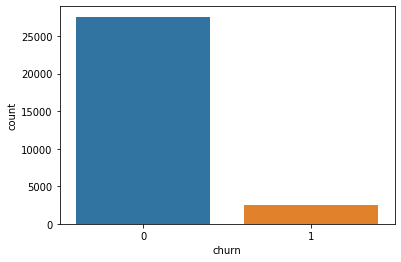

In [605]:
# As you can see below ,churn case class is IMBALANCED 
print(df_hvc.groupby('churn').size())

sns.countplot(x="churn", data=df_hvc)

In [544]:
# Checking the churn rate 
churn = (sum(df_hvc['churn'])/len(df_hvc['churn'].index))*100
print("Churn Rate : ",churn)

Churn Rate :  8.136395453484884


In [598]:
# import required libraries
from sklearn.model_selection import train_test_split
from sklearn.pipeline import Pipeline
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import FeatureUnion
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report
from sklearn.metrics import roc_auc_score
from imblearn.metrics import sensitivity_specificity_support
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import cross_val_score
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.svm import SVC

# PreProcessing data


#### Splitting data into training & test set

In [540]:
# Dividing data into X  & Y 

X=df_hvc.drop('churn',axis=1)
y=df_hvc['churn']


In [541]:
print(X.shape)
print(y.shape)

(30001, 178)
(30001,)


In [573]:
X_train,X_test,y_train,y_test=train_test_split(X,y,train_size=0.7,test_size=0.30,random_state=42, stratify=y)

In [574]:
print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)

(21000, 178)
(9001, 178)
(21000,)
(9001,)


In [575]:
# Aggregating the categorical columns 

In [576]:
cat_cols=df_hvc.select_dtypes(exclude=['float64','int64']).columns.tolist()

In [577]:
cat_cols

['night_pck_user_6',
 'night_pck_user_7',
 'night_pck_user_8',
 'fb_user_6',
 'fb_user_7',
 'fb_user_8']

In [578]:
pd.options.display.float_format = '{:,.6f}'.format
train=pd.concat([X_train,y_train],axis=1)

# Calculating the Aggregate of categorical vars
for c in cat_cols :
    print(train.groupby(c).churn.mean())


night_pck_user_6
-1   0.098674
 0   0.067109
 1   0.091873
Name: churn, dtype: float64
night_pck_user_7
-1   0.115499
 0   0.055522
 1   0.053030
Name: churn, dtype: float64
night_pck_user_8
-1   0.140957
 0   0.028956
 1   0.020833
Name: churn, dtype: float64
fb_user_6
-1   0.098674
 0   0.069083
 1   0.067595
Name: churn, dtype: float64
fb_user_7
-1   0.115499
 0   0.059765
 1   0.055101
Name: churn, dtype: float64
fb_user_8
-1   0.140957
 0   0.065461
 1   0.024520
Name: churn, dtype: float64


In [579]:
# replace categories with aggregated values in each categorical column
mapp = {'night_pck_user_6' : {-1: 0.098674, 0: 0.067109, 1: 0.091873},
        'night_pck_user_7' : {-1: 0.115499, 0: 0.055522, 1: 0.053030},
        'night_pck_user_8' : {-1: 0.140957, 0: 0.028956, 1: 0.020833},
        'fb_user_6'        : {-1: 0.098674, 0: 0.069083, 1: 0.067595},
        'fb_user_7'        : {-1: 0.115499, 0: 0.059765, 1: 0.055101},
        'fb_user_8'        : {-1: 0.140957, 0: 0.065461, 1: 0.024520}
          }
X_train.replace(mapp, inplace = True)
X_test.replace(mapp, inplace = True)

In [580]:
X_train[cat_cols]

,night_pck_user_6,night_pck_user_7,night_pck_user_8,fb_user_6,fb_user_7,fb_user_8
85078,0.098674,0.115499,0.140957,0.098674,0.115499,0.140957
86943,0.067109,0.115499,0.028956,0.067595,0.115499,0.024520
97445,0.067109,0.055522,0.028956,0.067595,0.055101,0.024520
71343,0.067109,0.055522,0.028956,0.067595,0.055101,0.024520
22100,0.098674,0.115499,0.140957,0.098674,0.115499,0.140957
88558,0.098674,0.115499,0.140957,0.098674,0.115499,0.140957
52933,0.098674,0.115499,0.140957,0.098674,0.115499,0.140957
16319,0.067109,0.055522,0.028956,0.069083,0.059765,0.065461
3220,0.067109,0.055522,0.028956,0.067595,0.055101,0.024520
68571,0.067109,0.055522,0.028956,0.067595,0.055101,0.024520


In [581]:
X_test[cat_cols]

,night_pck_user_6,night_pck_user_7,night_pck_user_8,fb_user_6,fb_user_7,fb_user_8
21857,0.098674,0.115499,0.140957,0.098674,0.115499,0.140957
10029,0.098674,0.115499,0.028956,0.098674,0.115499,0.024520
72449,0.067109,0.055522,0.028956,0.067595,0.055101,0.024520
4463,0.098674,0.115499,0.140957,0.098674,0.115499,0.140957
17619,0.067109,0.055522,0.028956,0.067595,0.055101,0.024520
26623,0.067109,0.055522,0.028956,0.067595,0.055101,0.024520
33159,0.098674,0.055522,0.140957,0.098674,0.059765,0.140957
58256,0.098674,0.115499,0.140957,0.098674,0.115499,0.140957
96898,0.098674,0.115499,0.140957,0.098674,0.115499,0.140957
38785,0.098674,0.055522,0.028956,0.098674,0.055101,0.024520


In [582]:
X_train[cat_cols].dtypes

night_pck_user_6    float64
night_pck_user_7    float64
night_pck_user_8    float64
fb_user_6           float64
fb_user_7           float64
fb_user_8           float64
dtype: object

In [583]:
X_test[cat_cols].dtypes

night_pck_user_6    float64
night_pck_user_7    float64
night_pck_user_8    float64
fb_user_6           float64
fb_user_7           float64
fb_user_8           float64
dtype: object

In [584]:
X_train[cat_cols].info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 21000 entries, 85078 to 7773
Data columns (total 6 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   night_pck_user_6  21000 non-null  float64
 1   night_pck_user_7  21000 non-null  float64
 2   night_pck_user_8  21000 non-null  float64
 3   fb_user_6         21000 non-null  float64
 4   fb_user_7         21000 non-null  float64
 5   fb_user_8         21000 non-null  float64
dtypes: float64(6)
memory usage: 1.1 MB


In [585]:
X_test[cat_cols].info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 9001 entries, 21857 to 17033
Data columns (total 6 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   night_pck_user_6  9001 non-null   float64
 1   night_pck_user_7  9001 non-null   float64
 2   night_pck_user_8  9001 non-null   float64
 3   fb_user_6         9001 non-null   float64
 4   fb_user_7         9001 non-null   float64
 5   fb_user_8         9001 non-null   float64
dtypes: float64(6)
memory usage: 492.2 KB


In [586]:
# Importing matplotlib and seaborn
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

In [587]:
# Let's see the correlation matrix 
#plt.figure(figsize = (20,20))        # Size of the figure
#sns.heatmap(X_train.corr(),annot = True)
X_train.corr()

,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_2g_6,arpu_2g_7,arpu_2g_8,night_pck_user_6,night_pck_user_7,night_pck_user_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,fb_user_6,fb_user_7,fb_user_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,days_since_recharge_6,days_since_recharge_7,days_since_recharge_8,arpu_diff,onnet_mou_diff,offnet_mou_diff,roam_ic_mou_diff,roam_og_mou_diff,loc_og_mou_diff,std_og_mou_diff,isd_og_mou_diff,spl_og_mou_diff,total_og_mou_diff,loc_ic_mou_diff,std_ic_mou_diff,isd_ic_mou_diff,spl_ic_mou_diff,total_ic_mou_diff,total_rech_num_diff,total_rech_amt_diff,max_rech_amt_diff,total_rech_data_diff,max_rech_data_diff,av_rech_amt_data_diff,vol_2g_mb_diff,vol_3g_mb_diff
arpu_6,1.000000,0.594969,0.511585,0.428928,0.283836,0.246605,0.598412,0.394754,0.352979,0.154459,0.126325,0.133489,0.200046,0.158028,0.160764,0.277817,0.222787,0.205164,0.425860,0.325690,0.289889,0.206995,0.162270,0.150722,0.071528,0.008370,0.020177,0.440005,0.342881,0.303591,0.321921,0.199740,0.169228,0.359342,0.217568,0.186426,0.094913,0.072193,0.068417,0.461108,0.278632,0.232305,0.221912,0.149084,0.151719,0.149042,0.066251,0.067425,0.157498,0.006783,0.012965,0.665076,0.436100,0.370175,0.183556,0.145539,0.134758,0.274710,0.211816,0.180275,0.088850,0.074470,0.064941,0.271117,0.208052,0.179769,0.187274,0.124790,0.112975,0.193041,0.128742,0.118177,0.059552,0.048057,0.037272,0.222641,0.150213,0.133239,0.313016,0.230583,0.199480,0.058042,-0.098295,-0.028776,0.107451,0.066583,0.061710,0.050627,0.041801,0.038158,0.424473,0.158857,0.136800,0.937626,0.573753,0.494880,0.350719,0.230001,0.254106,0.269478,0.170898,0.191975,-0.156628,-0.248344,-0.175557,0.054161,-0.049270,0.002454,-0.220583,-0.278393,-0.217084,0.105383,-0.005561,0.038599,0.059670,-0.094748,-0.023532,-0.099871,-0.152546,-0.120899,0.127824,0.037958,0.052983,0.220157,0.095404,0.122728,0.199343,0.071967,0.103167,0.141202,0.236649,0.151072,-0.045974,-0.094636,-0.069724,-0.212557,-0.260021,-0.205267,0.164757,0.062340,0.091240,-0.034001,-0.079212,-0.049639,0.138931,0.238274,0.161809,0.0

In [588]:
X_train.shape

(21000, 178)

## PCA

In [589]:
# applying pca to train data
pca = Pipeline([('scaler', StandardScaler()), ('pca', PCA())])

In [590]:
pca.fit(X_train)
churn_pca = pca.fit_transform(X_train)

In [591]:
# extract pca model from pipeline
pca = pca.named_steps['pca']

# look at explainded variance of PCA components
print(pd.Series(np.round(pca.explained_variance_ratio_.cumsum(), 4)*100))

0      11.680000
1      21.320000
2      27.250000
3      32.650000
4      36.890000
5      40.350000
6      43.020000
7      45.520000
8      47.780000
9      49.940000
10     51.940000
11     53.780000
12     55.440000
13     57.000000
14     58.540000
15     60.040000
16     61.380000
17     62.660000
18     63.910000
19     65.140000
20     66.340000
21     67.530000
22     68.620000
23     69.650000
24     70.660000
25     71.620000
26     72.530000
27     73.400000
28     74.250000
29     75.070000
30     75.870000
31     76.660000
32     77.420000
33     78.160000
34     78.870000
35     79.550000
36     80.220000
37     80.850000
38     81.470000
39     82.060000
40     82.640000
41     83.170000
42     83.690000
43     84.200000
44     84.700000
45     85.190000
46     85.670000
47     86.130000
48     86.580000
49     87.020000
50     87.450000
51     87.880000
52     88.300000
53     88.700000
54     89.080000
55     89.450000
56     89.810000
57     90.170000
58     90.5100

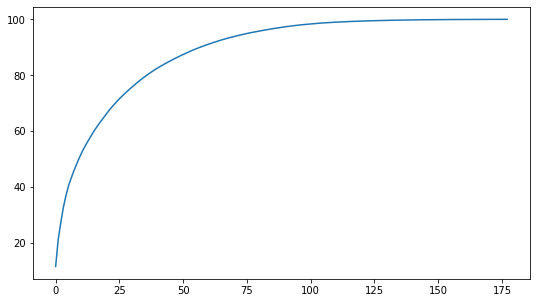

In [593]:

# plot feature variance
features = range(pca.n_components_)
cumulative_variance = np.round(np.cumsum(pca.explained_variance_ratio_)*100, decimals=4)
plt.figure(figsize=(178/20,100/20)) # 100 elements on y-axis; 178 elements on x-axis; 20 is normalising factor
plt.plot(cumulative_variance)

# PCA & Logistic Regression(with class_weight)

In [594]:
# create pipeline
PCA_VARS = 60
steps = [('scaler', StandardScaler 
         ("pca", PCA(n_components=PCA_VARS)),
         ("logistic", LogisticRegression(class_weight='balanced'))
        ]
pipeline = Pipeline(steps)

In [595]:
# fit model
pipeline.fit(X_train, y_train)

# check score on train data
pipeline.score(X_train, y_train)

0.8167142857142857

## Evaluate on test data

In [599]:
# predict churn on test data
y_pred = pipeline.predict(X_test)

# create onfusion matrix
cm = confusion_matrix(y_test, y_pred)
print(cm)

# check sensitivity and specificity
sensitivity, specificity, _ = sensitivity_specificity_support(y_test, y_pred, average='binary')
print("Sensitivity: \t", round(sensitivity, 2), "\n", "Specificity: \t", round(specificity, 2), sep='')

# check area under curve
y_pred_prob = pipeline.predict_proba(X_test)[:, 1]
print("AUC:    \t", round(roc_auc_score(y_test, y_pred_prob),2))

[[6764 1505]
 [ 108  624]]
Sensitivity: 	0.85
Specificity: 	0.82
AUC:    	 0.91


(<Figure size 432x288 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x1a2c582978>)

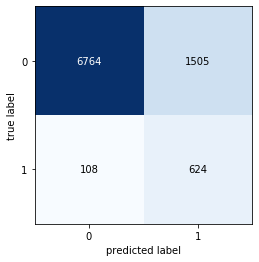

In [602]:
from mlxtend.plotting import plot_decision_regions, plot_confusion_matrix
plot_confusion_matrix(confusion_matrix(y_test, y_pred))

##  PCA & Logistic Regression with SMOTE

In [726]:
# create pipeline
# PCA_VARS = 60
# steps = [('scaler', StandardScaler()),
#          ("pca", PCA(n_components=PCA_VARS)),
#          ("smote",SMOTE(random_state=42)),
#          ("logistic", LogisticRegression())
#         ]
# pipeline = Pipeline(steps)

In [629]:
PCA_VARS = 60
pipe = make_pipeline(
    StandardScaler(),
    PCA(n_components=PCA_VARS),
    SMOTE(),
    LogisticRegression()
)

In [630]:
pipe.fit(X_train, y_train)


Pipeline(memory=None,
         steps=[('standardscaler',
                 StandardScaler(copy=True, with_mean=True, with_std=True)),
                ('pca',
                 PCA(copy=True, iterated_power='auto', n_components=60,
                     random_state=None, svd_solver='auto', tol=0.0,
                     whiten=False)),
                ('smote',
                 SMOTE(k_neighbors=5, n_jobs=None, random_state=None,
                       sampling_strategy='auto')),
                ('logisticregression',
                 LogisticRegression(C=1.0, class_weight=None, dual=False,
                                    fit_intercept=True, intercept_scaling=1,
                                    l1_ratio=None, max_iter=100,
                                    multi_class='auto', n_jobs=None,
                                    penalty='l2', random_state=None,
                                    solver='lbfgs', tol=0.0001, verbose=0,
                                    warm_start=Fals

In [631]:
# Predict..
y_pred_sm = pipe.predict(X_test)

              precision    recall  f1-score   support

           0       0.98      0.82      0.90      8269
           1       0.30      0.84      0.44       732

    accuracy                           0.83      9001
   macro avg       0.64      0.83      0.67      9001
weighted avg       0.93      0.83      0.86      9001



(<Figure size 432x288 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x1a415fff98>)

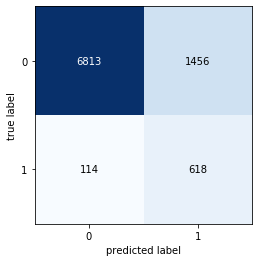

In [632]:
# Evaluate the model
print(classification_report(y_test, y_pred_sm))
plot_confusion_matrix(confusion_matrix(y_test, y_pred_sm))

In [637]:
X_train.head()

,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_2g_6,arpu_2g_7,arpu_2g_8,night_pck_user_6,night_pck_user_7,night_pck_user_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,fb_user_6,fb_user_7,fb_user_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,days_since_recharge_6,days_since_recharge_7,days_since_recharge_8,arpu_diff,onnet_mou_diff,offnet_mou_diff,roam_ic_mou_diff,roam_og_mou_diff,loc_og_mou_diff,std_og_mou_diff,isd_og_mou_diff,spl_og_mou_diff,total_og_mou_diff,loc_ic_mou_diff,std_ic_mou_diff,isd_ic_mou_diff,spl_ic_mou_diff,total_ic_mou_diff,total_rech_num_diff,total_rech_amt_diff,max_rech_amt_diff,total_rech_data_diff,max_rech_data_diff,av_rech_amt_data_diff,vol_2g_mb_diff,vol_3g_mb_diff
85078,469.744000,758.259000,550.074000,406.730000,742.630000,541.440000,102.780000,215.290000,146.160000,0.000000,0.000000,0.000000,18.160000,0.000000,0.000000,22.160000,80.780000,44.440000,76.440000,92.160000,106.210000,0.000000,0.000000,0.000000,8.530000,0.000000,0.000000,98.610000,172.940000,150.660000,368.110000,661.840000,496.990000,13.040000,123.130000,39.840000,0.000000,0.000000,0.000000,381.160000,784.980000,536.840000,0.000000,0.000000,0.000000,17.660000,18.440000,38.360000,7.580000,0.000000,0.000000,505.030000,976.380000,725.880000,17.410000,38.610000,66.110000,120.790000,130.190000,152.380000,0.000000,0.000000,0.000000,138.210000,168.810000,218.490000,121.380000,78.410000,141.110000,6.780000,45.190000,0.000000,0.000000,0.000000,0.000000,128.160000,123.610000,141.110000,266.380000,292.430000,359.610000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,23.000000,17.000000,27.000000,636.000000,798.000000,648.000000,110.000000,110.000000,130.000000,110.000000,110.000000,10.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.098674,0.115499,0.140957,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,

In [652]:
from sklearn.preprocessing import RobustScaler
scaler = RobustScaler()

#apply RobustScaler to df_hvc 
df_hvc_rs=pd.DataFrame(data=scaler.fit_transform(df_hvc),columns=df_hvc.columns.tolist())






In [653]:
#view the dataset to see the scaled columns
df_hvc_rs.head()

,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_2g_6,arpu_2g_7,arpu_2g_8,night_pck_user_6,night_pck_user_7,night_pck_user_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,fb_user_6,fb_user_7,fb_user_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,churn,days_since_recharge_6,days_since_recharge_7,days_since_recharge_8,arpu_diff,onnet_mou_diff,offnet_mou_diff,roam_ic_mou_diff,roam_og_mou_diff,loc_og_mou_diff,std_og_mou_diff,isd_og_mou_diff,spl_og_mou_diff,total_og_mou_diff,loc_ic_mou_diff,std_ic_mou_diff,isd_ic_mou_diff,spl_ic_mou_diff,total_ic_mou_diff,total_rech_num_diff,total_rech_amt_diff,max_rech_amt_diff,total_rech_data_diff,max_rech_data_diff,av_rech_amt_data_diff,vol_2g_mb_diff,vol_3g_mb_diff
0,-0.728852,-0.685031,-0.497147,-0.309409,-0.301995,-0.285795,-0.534528,-0.518816,-0.466123,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-0.330571,-0.334735,-0.298230,-0.406810,-0.419686,-0.368521,0.000000,-0.022831,0.000000,0.000000,0.000000,0.000000,-0.415369,-0.427821,-0.384557,-0.024724,-0.022983,-0.008057,-0.105863,-0.100075,-0.080319,0.000000,0.000000,0.000000,-0.097052,-0.088112,-0.071327,0.000000,0.000000,0.000000,-0.040307,-0.102305,-0.069919,0.000000,0.000000,0.000000,-0.553275,-0.549184,-0.474844,-0.408869,-0.416747,-0.372924,-0.523314,-0.535777,-0.469973,-0.153589,-0.163399,-0.047491,-0.539557,-0.558855,-0.503409,-0.046341,-0.052386,-0.015625,-0.211864,-0.207698,-0.170105,0.000000,0.000000,0.000000,-0.282007,-0.282741,-0.244667,-0.614256,-0.628788,-0.558212,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-0.555556,-0.666667,-0.666667,-0.430380,-0.647182,-0.452471,1.466667,1.377778,0.824324,1.947368,1.836364,1.553846,0.000000,0.000000,0.000000,1.474026,1.474026,1.487013,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,1.020202,0.871429,1.158163,0.361055,0.016330,0.111326,0.232954,0.367081,0.307729,6.062000,5.944802,10.141969,4.187290,4.493223,7.887361,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,0.000000,0.0000

In [654]:
print(df_hvc.shape)

(30001, 179)


In [662]:
#df_hvc.drop('churn',axis=1)

In [665]:
X_rs=df_hvc.drop('churn',axis=1) # independent variables X dataset
y_rs=df_hvc.churn # target/dependent variable y (churn/not churn)

In [666]:
print(X_rs.shape)
print(y_rs.shape)

(30001, 178)
(30001,)


In [671]:
#Splitting the dataset

X_train_rs, X_test_rs, y_train_rs, y_test_rs = train_test_split(X_rs, y_rs, stratify=y_rs,train_size=0.70, test_size=0.30, random_state=22)

In [675]:
#importing the classifiers
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
import time

In [676]:
models = {
    'Logistic Regression' : LogisticRegression(), 
    'Naive Bayes' : GaussianNB(),
     #'Support Vector Classifier' : SVC(),  computationally expensive to run on the whole dataset
    #'Decision Tree Classifier' : DecisionTreeClassifier()   computationally expensive
    
}

In [677]:
#Using the Imbalanced Dataset on the Classifiers
for name, model in models.items():
    t0 = time.time()  #start time
    model.fit(X_train_rs, y_train_rs)
    accuracy = cross_val_score(model, X_train_rs, y_train_rs, cv=5).mean()
    t1 = time.time()  #stop time
    print(name, 'Score: {}%'.format(round(accuracy, 2)*100))
    print('Computation Time: {}s\n'.format(round(t1-t0, 2)))
    print('*'*80)
    print()

Logistic Regression Score: 93.0%
Computation Time: 4.39s

********************************************************************************

Naive Bayes Score: 73.0%
Computation Time: 1.94s

********************************************************************************



## PCA with logistic Regression


In [689]:
# Creating X & y datasets
X = df_hvc.drop(['churn'],axis=1)
y = df_hvc['churn']


In [691]:
# Applying standard scaling
from sklearn import preprocessing
from sklearn.preprocessing import StandardScaler


scaler = preprocessing.StandardScaler().fit(X)

Xscaled = scaler.transform(X)

In [692]:
# TRain TEst split
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(Xscaled,y, train_size=0.7,random_state=42)

In [693]:

print(X_train.shape)
print(X_test.shape)

(21000, 178)
(9001, 178)


In [694]:
print("X_train Dataframe Shape {}".format(X_train.shape))
print("X_test Dataframe Shape {}".format(X_test.shape))

y_train_imb = (y_train == 1).sum()/(y_train == 0).sum()
y_test_imb = (y_test == 1).sum()/(y_test == 0).sum()
print("Imbalance in Train Data: {}".format(y_train_imb))
print("Imbalance in Test Data: {}".format(y_test_imb))

X_train Dataframe Shape (21000, 178)
X_test Dataframe Shape (9001, 178)
Imbalance in Train Data: 0.09034267912772585
Imbalance in Test Data: 0.0844578313253012


In [699]:
# Applying SMOTE
from imblearn.over_sampling import SMOTE
sm = SMOTE(random_state=42)
X_tr,y_tr = sm.fit_sample(X_train,y_train)
print(X_tr.shape)
print(y_tr.shape)


(38520, 178)
(38520,)


In [702]:
print(np.count_nonzero(y_tr))

19260


In [703]:
print("X_tr Dataframe Shape {}".format(X_tr.shape))
print("y_tr Dataframe Shape {}".format(y_tr.shape))

data_imbalance = (y_tr == 1).sum()/(y_tr == 0).sum()
print("Imbalance in Train Data: {}".format(data_imbalance))

X_tr Dataframe Shape (38520, 178)
y_tr Dataframe Shape (38520,)
Imbalance in Train Data: 1.0


In [704]:
# Applying PCA :- 
from sklearn.decomposition import PCA
pca = PCA(random_state=100)

#Doing the PCA on the train data
pca.fit(X_tr)

PCA(copy=True, iterated_power='auto', n_components=None, random_state=100,
    svd_solver='auto', tol=0.0, whiten=False)

In [705]:
df_train_pca = pca.fit_transform(X_tr)
print(df_train_pca.shape)

df_test_pca = pca.transform(X_test)
print(df_test_pca.shape)

(38520, 178)
(9001, 178)


In [706]:
colnames = list(X.columns)
pcs_df = pd.DataFrame({'PC1':pca.components_[0],'PC2':pca.components_[1], 'PC3':pca.components_[2],'Feature':colnames})
pcs_df.head(10)


,PC1,PC2,PC3,Feature
0,-0.094874,0.092933,0.159821,arpu_6
1,-0.058027,0.160450,0.067105,arpu_7
2,0.022372,0.208637,-0.063786,arpu_8
3,-0.134877,0.039128,0.022645,onnet_mou_6
4,-0.105766,0.074833,-0.031161,onnet_mou_7
5,-0.043102,0.107189,-0.090710,onnet_mou_8
6,-0.134613,0.081407,0.082034,offnet_mou_6
7,-0.105933,0.123145,0.012468,offnet_mou_7
8,-0.027069,0.156314,-0.073298,offnet_mou_8
9,-0.009831,0.020493,-0.000617,roam_ic_mou_6


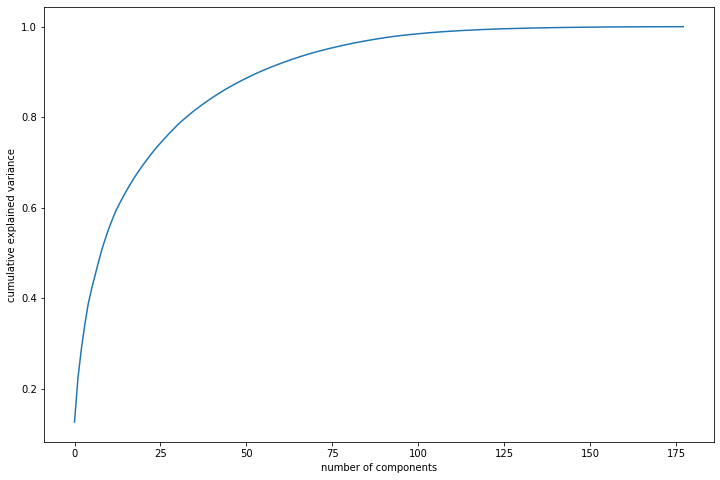

In [707]:
#Making the screeplot - plotting the cumulative variance against the number of components
%matplotlib inline
fig = plt.figure(figsize = (12,8))
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance')
plt.show()

In [709]:
#np.cumsum(np.round(pca.explained_variance_ratio_, decimals=4)*100)

print(pd.Series(np.round(pca.explained_variance_ratio_.cumsum(), 4)*100))

0      12.640000
1      22.350000
2      28.820000
3      34.200000
4      38.830000
5      42.160000
6      45.150000
7      48.080000
8      50.870000
9      53.240000
10     55.440000
11     57.410000
12     59.280000
13     60.790000
14     62.230000
15     63.610000
16     64.930000
17     66.170000
18     67.360000
19     68.460000
20     69.540000
21     70.550000
22     71.560000
23     72.520000
24     73.440000
25     74.310000
26     75.140000
27     75.960000
28     76.780000
29     77.550000
30     78.310000
31     79.030000
32     79.690000
33     80.330000
34     80.960000
35     81.570000
36     82.140000
37     82.700000
38     83.250000
39     83.780000
40     84.290000
41     84.790000
42     85.270000
43     85.750000
44     86.200000
45     86.630000
46     87.060000
47     87.480000
48     87.880000
49     88.270000
50     88.640000
51     89.010000
52     89.380000
53     89.730000
54     90.070000
55     90.390000
56     90.710000
57     91.020000
58     91.3200

# Around 54 variables explaining 90% of variance

In [710]:
#Applying logistic regression with 54 vars
n_vars=54
pca_54 = PCA(n_components=n_vars)

In [711]:
df_train_pca_54 = pca_54.fit_transform(X_tr)
print(df_train_pca_54.shape)
df_test_pca_54 = pca_54.transform(X_test)


(38520, 54)
(38520, 54)


In [723]:
print(df_test_pca_54.shape)

(9001, 54)


In [712]:
from sklearn.linear_model import LogisticRegression
from sklearn import metrics
log_1 = LogisticRegression(C=1e9)
log_1.fit(df_train_pca_54, y_tr)

# Predicted probabilities
y_pred_54 = log_1.predict(df_test_pca_54)
# Converting y_pred to a dataframe which is an array
y_pred_df = pd.DataFrame(y_pred_54)

In [713]:
print(confusion_matrix(y_test,y_pred_54))

[[6811 1489]
 [ 130  571]]


In [717]:
from sklearn.metrics import accuracy_score
print("LogisticRegression accuracy with PCA: ",accuracy_score(y_test,y_pred_54))

LogisticRegression accuracy with PCA:  0.8201310965448283


In [ ]:
models = {
    'Logistic Regression' : LogisticRegression(), 
    'Naive Bayes' : GaussianNB(),
     #'Support Vector Classifier' : SVC(),  computationally expensive to run on the whole dataset
    #'Decision Tree Classifier' : DecisionTreeClassifier()   computationally expensive
    
}

              precision    recall  f1-score   support

           0       0.98      0.82      0.89      8300
           1       0.28      0.81      0.41       701

    accuracy                           0.82      9001
   macro avg       0.63      0.82      0.65      9001
weighted avg       0.93      0.82      0.86      9001



(<Figure size 432x288 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x1a408911d0>)

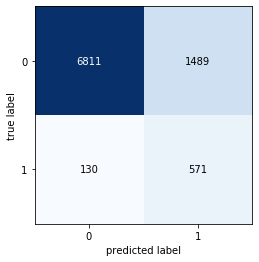

In [718]:
print(classification_report(y_test, y_pred_54))
plot_confusion_matrix(confusion_matrix(y_test, y_pred_54))

In [724]:
# Making predictions on the test set
pred_probs_test = log_1.predict_proba(df_test_pca_54)

In [756]:
from sklearn.metrics import recall_score, precision_score, accuracy_score, f1_score

print('test-set confusion matrix:\n', confusion_matrix(y_test,y_pred_54)) 
print("recall score: ", recall_score(y_test,y_pred_54))
print("precision score: ", precision_score(y_test,y_pred_54))
print("f1 score: ", f1_score(y_test,y_pred_54))
print("accuracy score: ", accuracy_score(y_test,y_pred_54))
print("ROC AUC: {}".format(roc_auc_score(y_test, pred_probs_test[:,1])))

test-set confusion matrix:
 [[6811 1489]
 [ 130  571]]
recall score:  0.8145506419400856
precision score:  0.2771844660194175
f1 score:  0.4136182542557045
accuracy score:  0.8201310965448283
ROC AUC: 0.8926655552309093


In [725]:
# AUC Score
"{:2.2}".format(metrics.roc_auc_score(y_test, pred_probs_test[:,1]))

'0.89'

# Naive Bayes

In [727]:
from sklearn.naive_bayes import GaussianNB

In [749]:
# from sklearn.linear_model import LogisticRegression
# from sklearn import metrics
nb_1 = GaussianNB()
nb_1.fit(df_train_pca_54, y_tr)

# Predicted probabilities
y_nb_pred_54 = nb_1.predict(df_test_pca_54)
y_nb_pred_prob = nb_1.predict_proba(df_test_pca_54)


In [752]:
# Not required just for myself doing on training data
train_pred = nb_1.predict(df_train_pca_54)
print('train-set confusion matrix:\n', confusion_matrix(y_tr,train_pred)) 


train-set confusion matrix:
 [[11083  8177]
 [ 3532 15728]]


              precision    recall  f1-score   support

           0       0.96      0.57      0.72      8300
           1       0.12      0.70      0.21       701

    accuracy                           0.58      9001
   macro avg       0.54      0.64      0.46      9001
weighted avg       0.89      0.58      0.68      9001



(<Figure size 432x288 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x1a4115c5f8>)

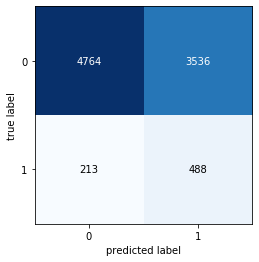

In [753]:
print(classification_report(y_test, y_nb_pred_54))
plot_confusion_matrix(confusion_matrix(y_test, y_nb_pred_54))

In [755]:
from sklearn.metrics import recall_score, precision_score, accuracy_score, f1_score

print('test-set confusion matrix:\n', confusion_matrix(y_test,y_nb_pred_54)) 
print("recall score: ", recall_score(y_test,y_nb_pred_54))
print("precision score: ", precision_score(y_test,y_nb_pred_54))
print("f1 score: ", f1_score(y_test,y_nb_pred_54))
print("accuracy score: ", accuracy_score(y_test,y_nb_pred_54))
print("ROC AUC: {}".format(roc_auc_score(y_test, y_nb_pred_prob[:,1])))

test-set confusion matrix:
 [[4764 3536]
 [ 213  488]]
recall score:  0.6961483594864479
precision score:  0.12127236580516898
f1 score:  0.20656084656084656
accuracy score:  0.5834907232529719
ROC AUC: 0.6987968994379803


# SVM using non linear model

Classification report: 
              precision    recall  f1-score   support

           0       0.98      0.90      0.94      8300
           1       0.39      0.76      0.52       701

    accuracy                           0.89      9001
   macro avg       0.68      0.83      0.73      9001
weighted avg       0.93      0.89      0.90      9001


Accuracy for the test dataset 89.0%

ROC for the test dataset 82.8%


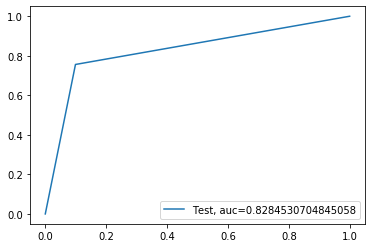

In [760]:

from sklearn import svm 

# rbf kernel with other hyperparameters kept to default 
svm_rbf = svm.SVC(kernel='rbf')
svm_rbf.fit(df_train_pca_54, y_tr)
# predict
predictions = svm_rbf.predict(df_test_pca_54)
print("Classification report: ")
print(classification_report(y_test,predictions))
accuracy = metrics.accuracy_score(y_test, predictions)
print("\nAccuracy for the test dataset",'{:.1%}'.format(accuracy) )
fpr, tpr, threshold = metrics.roc_curve(y_test, predictions)
roc_auc = metrics.auc(fpr, tpr)
print("\nROC for the test dataset",'{:.1%}'.format(roc_auc))
plt.plot(fpr,tpr,label="Test, auc="+str(roc_auc))
plt.legend(loc=4)
plt.show()

              precision    recall  f1-score   support

           0       0.98      0.90      0.94      8300
           1       0.39      0.76      0.52       701

    accuracy                           0.89      9001
   macro avg       0.68      0.83      0.73      9001
weighted avg       0.93      0.89      0.90      9001



(<Figure size 432x288 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x1a42479860>)

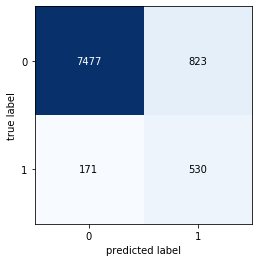

In [761]:
#SVM - Default - rbf kernel(non Linear)
print(classification_report(y_test, predictions))
plot_confusion_matrix(confusion_matrix(y_test, predictions))

In [765]:
print('test-set confusion matrix:\n', confusion_matrix(y_test,predictions)) 
print("recall score: ", recall_score(y_test,predictions))
print("precision score: ", precision_score(y_test,predictions))
print("f1 score: ", f1_score(y_test,predictions))
print("accuracy score: ", accuracy_score(y_test,predictions))


test-set confusion matrix:
 [[7477  823]
 [ 171  530]]
recall score:  0.7560627674750356
precision score:  0.3917220990391722
f1 score:  0.5160662122687439
accuracy score:  0.8895678257971337


### SVM using linear model

Classification report: 
              precision    recall  f1-score   support

           0       0.98      0.83      0.90      8300
           1       0.29      0.81      0.42       701

    accuracy                           0.83      9001
   macro avg       0.63      0.82      0.66      9001
weighted avg       0.93      0.83      0.86      9001


Accuracy for the test dataset 82.9%

ROC for the test dataset 82.0%


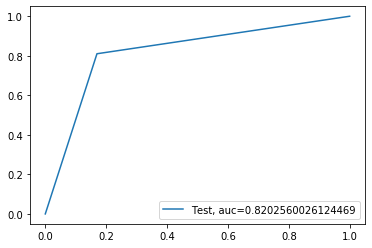

In [771]:
# linear kernel with other hyperparameters kept to default 
svm_lin = svm.SVC(kernel='linear')
svm_lin.fit(df_train_pca_54, y_tr)
# predict
pred_lin = svm_lin.predict(df_test_pca_54)
print("Classification report: ")
print(classification_report(y_test,pred_lin))
accuracy = metrics.accuracy_score(y_test, pred_lin)
print("\nAccuracy for the test dataset",'{:.1%}'.format(accuracy) )
fpr, tpr, threshold = metrics.roc_curve(y_test, pred_lin)
roc_auc = metrics.auc(fpr, tpr)
print("\nROC for the test dataset",'{:.1%}'.format(roc_auc))
plt.plot(fpr,tpr,label="Test, auc="+str(roc_auc))
plt.legend(loc=4)
plt.show()

              precision    recall  f1-score   support

           0       0.98      0.83      0.90      8300
           1       0.29      0.81      0.42       701

    accuracy                           0.83      9001
   macro avg       0.63      0.82      0.66      9001
weighted avg       0.93      0.83      0.86      9001



(<Figure size 432x288 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x1a426ee978>)

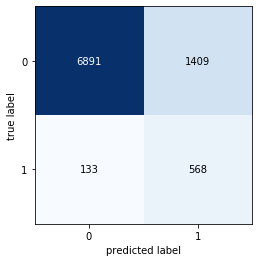

In [772]:
#SVM - Default - rbf kernel(non Linear)
print(classification_report(y_test, pred_lin))
plot_confusion_matrix(confusion_matrix(y_test, pred_lin))

In [773]:
print('test-set confusion matrix:\n', confusion_matrix(y_test,pred_lin)) 
print("recall score: ", recall_score(y_test,pred_lin))
print("precision score: ", precision_score(y_test,pred_lin))
print("f1 score: ", f1_score(y_test,pred_lin))
print("accuracy score: ", accuracy_score(y_test,pred_lin))

test-set confusion matrix:
 [[6891 1409]
 [ 133  568]]
recall score:  0.8102710413694721
precision score:  0.28730399595346484
f1 score:  0.42419716206123975
accuracy score:  0.8286857015887124


# Grid Search: Hyperparameter Tuning


In [775]:
# creating a KFold object with 5 splits 
folds = KFold(n_splits = 5, shuffle = True, random_state = 101)

# Set the parameters by cross-validation
hyper_params = [ {'gamma': [1e-1,1e-2, 1e-3, 1e-4], 'C': [1, 10, 100, 1000]}]

# specify model
model = svm.SVC(kernel="rbf")

# set up GridSearchCV()
model_cv_svm = GridSearchCV(estimator = model, 
                        param_grid = hyper_params, 
                        scoring= 'accuracy', 
                        cv = folds, 
                        n_jobs = -1,
                        verbose = 1,
                        return_train_score=True)      

# fit the model
model_cv_svm.fit(df_train_pca_54, y_tr)  

Fitting 5 folds for each of 16 candidates, totalling 80 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed: 22.3min
[Parallel(n_jobs=-1)]: Done  80 out of  80 | elapsed: 53.7min finished


GridSearchCV(cv=KFold(n_splits=5, random_state=101, shuffle=True),
             error_score=nan,
             estimator=SVC(C=1.0, break_ties=False, cache_size=200,
                           class_weight=None, coef0=0.0,
                           decision_function_shape='ovr', degree=3,
                           gamma='scale', kernel='rbf', max_iter=-1,
                           probability=False, random_state=None, shrinking=True,
                           tol=0.001, verbose=False),
             iid='deprecated', n_jobs=-1,
             param_grid=[{'C': [1, 10, 100, 1000],
                          'gamma': [0.1, 0.01, 0.001, 0.0001]}],
             pre_dispatch='2*n_jobs', refit=True, return_train_score=True,
             scoring='accuracy', verbose=1)

In [777]:
def display_hyper_stats(cv_results,param_value):
    gamma = cv_results[cv_results['param_gamma']==param_value]
    plt.plot(gamma["param_C"], gamma["mean_test_score"])
    plt.plot(gamma["param_C"], gamma["mean_train_score"])
    plt.xlabel('C')
    plt.ylabel('Accuracy')
    plt.title("Gamma="+str(param_value))
    plt.ylim([0.60, 1])
    plt.legend(['test accuracy', 'train accuracy'], loc='lower right')
    plt.xscale('log')  

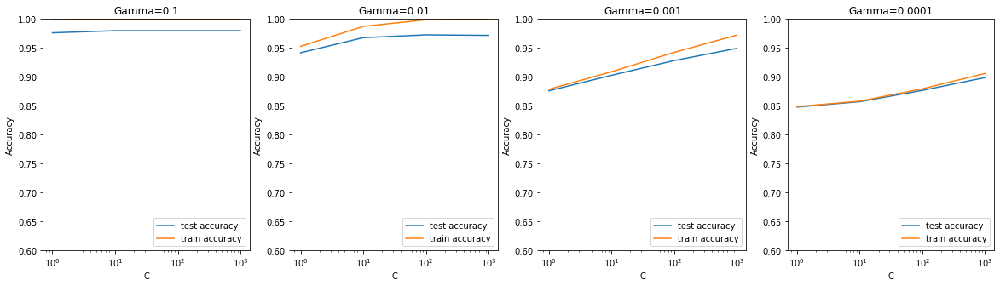

In [780]:
# cv results
svm_cv_results = pd.DataFrame(model_cv_svm.cv_results_)
svm_cv_results['param_C'] = svm_cv_results['param_C'].astype('int')
gamma=[1e-1,1e-2, 1e-3, 1e-4]
plt.figure(figsize=(20,5))
plt.subplot(141)
display_hyper_stats(svm_cv_results,gamma[0])
plt.subplot(142)
display_hyper_stats(svm_cv_results,gamma[1])
plt.subplot(143)
display_hyper_stats(svm_cv_results,gamma[2])
plt.subplot(144)
display_hyper_stats(svm_cv_results,gamma[3])
plt.show()

In [782]:
# printing the optimal accuracy score and hyperparameters

print("The best test score is {0} corresponding to hyperparameters {1}".format(round(model_cv_svm.best_score_,2), model_cv_svm.best_params_))



The best test score is 0.98 corresponding to hyperparameters {'C': 100, 'gamma': 0.1}


In [784]:
# model with optimal hyperparameters
final_svm_model = svm.SVC(C=10, gamma=0.1, kernel="rbf")

final_svm_model.fit(df_train_pca_54, y_tr)
y_pred_final = final_svm_model.predict(df_test_pca_54)

# metrics
print("Max accuracy with SVM (rbf) is "+str(round(metrics.accuracy_score(y_test, y_pred_final),2)))

Max accuracy with SVM (rbf) is 0.92


              precision    recall  f1-score   support

           0       0.93      0.99      0.96      8300
           1       0.53      0.14      0.23       701

    accuracy                           0.92      9001
   macro avg       0.73      0.57      0.59      9001
weighted avg       0.90      0.92      0.90      9001



(<Figure size 432x288 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x1a8bd04c88>)

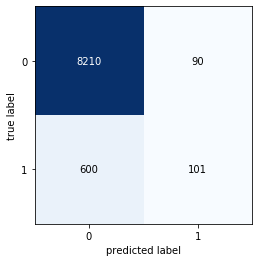

In [785]:
# confusion matrix for SVM(rbf) Model tuned via hyper-parameters 
print(classification_report(y_test, y_pred_final))
plot_confusion_matrix(confusion_matrix(y_test, y_pred_final))

In [786]:
print('test-set confusion matrix:\n', confusion_matrix(y_test,y_pred_final)) 
print("recall score: ", recall_score(y_test,y_pred_final))
print("precision score: ", precision_score(y_test,y_pred_final))
print("f1 score: ", f1_score(y_test,y_pred_final))
print("accuracy score: ", accuracy_score(y_test,y_pred_final))

test-set confusion matrix:
 [[8210   90]
 [ 600  101]]
recall score:  0.14407988587731813
precision score:  0.5287958115183246
f1 score:  0.22645739910313903
accuracy score:  0.923341850905455
